# 5510 Final Project - Unsupervised Learning on Country Data

Kaggle: https://www.kaggle.com/datasets/rohan0301/unsupervised-learning-on-country-data

GitHub: https://github.com/sean-coffey/5510_final_project

## 1) Project Setup

### Introduction and Objectives
For this project, I wanted to find a simple dataset that I could use to explore the various unsupervised learning techniques that we've been learning in the lectures. In particular:
1) Principal Component Analysis - To investigate how to understand and interpret the principal components. The maths/functions to generate them are simple enough, but I want to improve my ability to relate the resulting components to the original features and to visualise them in ways that help understanding.
2) K-Means Clustering - Generating them is straightforward. My objectives are to find out more about how to optimise the number of clusters, how to score them, and how to visualise them.
3) Comparison with other clustering methods - A secondary objective, time allowing.

The more I study these ML methods, the more I find that the code generation, albeit with the assistance of AI, is not the issue. I have no qualms about using AI, the tools are here we need to learn how to deploy them effectively. However, I do want to focus on: effective usage, interpretation of results, drawing conclusions, understanding parameters clearly, in order to avoid the many rabbit holes associated with complex libraries such as scikit-learn.

If I am able to generate a reasonably meaninful clustered description of the Country Data based on the socio-economic features therein and achieve these learning objectives, I will consider the project a success.

#### A Note on Project Setup

As we do these learning projects, I am trying to build a library of functions that will help me complete basic EDA and preprocessing quickly and efficiently. That is why there is so much code in the Project Setup section.

In [1]:
# System stuff
import os
import sys
from pathlib import Path

# Basic data science
import random
import numpy as np
import pandas as pd
import math
import statsmodels.api as sm

import kagglehub   # need this to download dataset

# Visualisation
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from itertools import combinations
import seaborn as sns
from datetime import datetime

from sklearn.cluster import KMeans
%matplotlib inline

from scipy.spatial import ConvexHull # to highlight clusters
import scipy.cluster.hierarchy as sch # for hierarchical clustering charts

# Scikit-learn (including 3 or 4 that I didn't end up keeping in the final code.
from sklearn.preprocessing import RobustScaler, StandardScaler
from sklearn.decomposition import PCA
from sklearn.base import BaseEstimator, TransformerMixin
from sklearn.preprocessing import FunctionTransformer
from sklearn.compose import ColumnTransformer
from sklearn.cluster import DBSCAN, AgglomerativeClustering
from sklearn.neighbors import NearestNeighbors
from sklearn.pipeline import Pipeline

from sklearn.metrics import (
    silhouette_score, calinski_harabasz_score, davies_bouldin_score
)

# Reproducibility
SEED = 42
random.seed(SEED)
np.random.seed(SEED)

# helper function to delimit sections in data output
def section_split(width=160, char="-"):
    print("\n", char * width, "\n")

# Plotting defaults
sns.set_theme(
    context="notebook",
    style="darkgrid",
    palette="deep"
)
plt.rcParams.update({
    "figure.figsize": (8, 5),
    "figure.dpi": 300,
    "axes.titlesize": 12,
    "axes.labelsize": 10
})

# helper function to save figures
def save_figure(name=None, dpi=300, bbox_inches='tight', pad_inches=0.1):
    # Create directory if it doesn't exist
    save_dir = "figs/5510_final_project"
    os.makedirs(save_dir, exist_ok=True)
    # Generate filename
    if name is None:
        timestamp = datetime.now().strftime("%Y%m%d_%H%M%S")
        filename = f"chart_{timestamp}.png"
    else:
        # Clean the name to be filename-safe
        filename = "".join(c for c in name if c.isalnum() or c in (' ', '-', '_')).rstrip()
        filename = filename.replace(' ', '_')
        if not filename.endswith('.png'):
            filename += '.png'
    # Full path
    filepath = os.path.join(save_dir, filename)
    # Save the figure
    plt.savefig(filepath, dpi=dpi, bbox_inches=bbox_inches, pad_inches=pad_inches)
    print(f"Figure saved: {filepath}")
    return filepath

def setup_plot_grid(n=9):
    if n < 5:
        n_cols = 2
    if n > 9:
        n_cols = 4
    else:
        n_cols = 3
    n_rows = math.ceil(n / n_cols)
    fig, axes = plt.subplots(n_rows, n_cols, figsize=(n_cols * 4.5, n_rows * 3.5), constrained_layout=True)
    axes = np.array(axes).reshape(-1)  # flatten in case of single row/col
    return fig, axes

def plot_hist(data, num_cols=None, filename="histograms"):
    if num_cols is None:
        num_cols = data.select_dtypes(include=["int", "float"]).columns.tolist()

    fig, axes = setup_plot_grid(len(num_cols))

    for i, col in enumerate(num_cols):
        ax = axes[i]
        sns.histplot(country_data[col].dropna(), bins=30, kde=True, ax=ax)
        ax.set_title(col)
        ax.set_xlabel("")
        ax.set_ylabel("Count")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    fig.suptitle("Distributions of Numeric Features")
    save_figure(filename)
    plt.show()
    return

def plot_outliers(data, num_cols=None, filename="outliers"):
    if num_cols is None:
        num_cols = data.select_dtypes(include=["int", "float"]).columns.tolist()

    fig, axes = setup_plot_grid(len(num_cols))
    colours = sns.color_palette(n_colors=len(num_cols))


    for i, col in enumerate(num_cols):
        ax = axes[i]
        sns.boxplot(x = data[col], ax=ax, color=colours[i])
        box_title = f"{col} , mean = {data[col].mean():.1f}, std_dev = {data[col].std():.1f}"
        ax.set_title(box_title)
        ax.set_xlabel("")

    # Hide any unused subplots
    for j in range(i + 1, len(axes)):
        axes[j].set_visible(False)

    fig.suptitle("Outliers for Numeric Features")
    save_figure(filename)
    plt.show()
    return

def identify_outliers_by_iqr(data, column, multiplier=1.5):
    """
    Identify outliers using the IQR method (same method used by boxplots).
    Returns a DataFrame of outlier rows and their values.
    """
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - multiplier * IQR
    upper_bound = Q3 + multiplier * IQR

    # Find outliers
    outliers_mask = (data[column] < lower_bound) | (data[column] > upper_bound)
    outliers_df = data[outliers_mask][['country', column]].copy()
    outliers_df['outlier_type'] = 'extreme_low'
    outliers_df.loc[data[column] > upper_bound, 'outlier_type'] = 'extreme_high'

    return outliers_df.sort_values(column)

def identify_all_outliers(data, num_cols=None):
    """
    Identify outliers for all numeric columns and display results.
    """
    if num_cols is None:
        num_cols = data.select_dtypes(include=["int", "float"]).columns.tolist()

    all_outliers = {}

    for col in num_cols:
        outliers = identify_outliers_by_iqr(data, col)
        if not outliers.empty:
            all_outliers[col] = outliers
            print(f"\n=== Outliers for {col} ===")
            print(f"Total outliers: {len(outliers)}")
            print(outliers.to_string(index=False))
        else:
            print(f"\n=== No outliers found for {col} ===")

    return all_outliers


# Method to get the row indices (useful for further analysis)
def get_outlier_indices(data, column):
    """
    Get the DataFrame indices of outlier rows for a specific column.
    """
    Q1 = data[column].quantile(0.25)
    Q3 = data[column].quantile(0.75)
    IQR = Q3 - Q1

    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    outliers_mask = (data[column] < lower_bound) | (data[column] > upper_bound)
    outlier_indices = data[outliers_mask].index.tolist()

    return outlier_indices

def null_nans(data):
    missing = 0
    for col in data.columns:
        nulls = data[col].isnull().sum()
        nans = data[col].isna().sum()
        if nulls > 0:
            print(f"Column '{col}' has {nulls} null values.")
            missing += nulls
        if nans > 0:
            print(f"Column '{col}' has {nans} NaN values.")
            missing += nans
    print(f"Total missing values (NaNs or Nulls): {missing}")
    return

print("Python:", sys.version.split()[0])
print("Pandas:", pd.__version__)

Python: 3.11.13
Pandas: 2.3.2


### Load Data - Country Data

From Kaggle - Clustering the Countries by using Unsupervised Learning for HELP International:

#### Objective:

To categorise the countries using socio-economic and health factors that determine the overall development of the country.

#### About organization:

HELP International is an international humanitarian NGO that is committed to fighting poverty and providing the people of backward countries with basic amenities and relief during the time of disasters and natural calamities.

#### Original Problem Statement:

HELP International have been able to raise around $ 10 million. Now the CEO of the NGO needs to decide how to use this money strategically and effectively. So, CEO has to make decision to choose the countries that are in the direst need of aid. Hence, your Job as a Data scientist is to categorise the countries using some socio-economic and health factors that determine the overall development of the country. Then you need to suggest the countries which the CEO needs to focus on the most.

#### For this Project

I am going to focus on finding a clustering solution that separates countries into groups based on their socio-economic and health factors. I am not focused on using this result to make recommendations about aid.


In [2]:
# Set flag to determine if we get the latest version from Kaggle
use_cache = False

if use_cache:
    path = "/Users/seancoffey/.cache/kagglehub/datasets/rohan0301/unsupervised-learning-on-country-data/versions/2"
else:
    # Download latest version
    path = kagglehub.dataset_download("rohan0301/unsupervised-learning-on-country-data")
    # print("Path to dataset files:", path)

p = Path(path)
files = [f.name for f in p.iterdir() if f.is_file()]
print("Files in folder:")
for name in files:
    print("-", name)

csv_files = sorted(p.rglob("*.csv"))
if not csv_files:
    raise FileNotFoundError(f"No CSV files found under {p}")
country_data = pd.read_csv(csv_files[0])
data_dict = pd.read_csv(csv_files[1])
print("Loaded:", csv_files[0].name, country_data.shape)
print("Loaded:", csv_files[1].name, data_dict.shape)
section_split(width=100)
print('Country Data\n','='*20)
display(country_data.head())
section_split(width=100)
print('Feature Descriptions\n','='*20)
for i in data_dict.index:
    print(f"{data_dict.loc[i, 'Column Name']:<15} - {data_dict.loc[i, 'Description']}")
section_split(width=100)

Files in folder:
- data-dictionary.csv
- Country-data.csv
Loaded: Country-data.csv (167, 10)
Loaded: data-dictionary.csv (10, 2)

 ---------------------------------------------------------------------------------------------------- 

Country Data


,country,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
0,Afghanistan,90.2,10.0,7.58,44.9,1610,9.44,56.2,5.82,553
1,Albania,16.6,28.0,6.55,48.6,9930,4.49,76.3,1.65,4090
2,Algeria,27.3,38.4,4.17,31.4,12900,16.10,76.5,2.89,4460
3,Angola,119.0,62.3,2.85,42.9,5900,22.40,60.1,6.16,3530
4,Antigua and Barbuda,10.3,45.5,6.03,58.9,19100,1.44,76.8,2.13,12200



 ---------------------------------------------------------------------------------------------------- 

Feature Descriptions
country         - Name of the country
child_mort      - Death of children under 5 years of age per 1000 live births
exports         - Exports of goods and services per capita. Given as %age of the GDP per capita
health          - Total health spending per capita. Given as %age of GDP per capita
imports         - Imports of goods and services per capita. Given as %age of the GDP per capita
Income          - Net income per person
Inflation       - The measurement of the annual growth rate of the Total GDP
life_expec      - The average number of years a new born child would live if the current mortality patterns are to remain the same
total_fer       - The number of children that would be born to each woman if the current age-fertility rates remain the same.
gdpp            - The GDP per capita. Calculated as the Total GDP divided by the total population.

 -------

## 2) Exploratory Data Analysis

,child_mort,exports,health,imports,income,inflation,life_expec,total_fer,gdpp
count,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000,167.000000
mean,38.270060,41.108976,6.815689,46.890215,17144.688623,7.781832,70.555689,2.947964,12964.155689
std,40.328931,27.412010,2.746837,24.209589,19278.067698,10.570704,8.893172,1.513848,18328.704809
min,2.600000,0.109000,1.810000,0.065900,609.000000,-4.210000,32.100000,1.150000,231.000000
25%,8.250000,23.800000,4.920000,30.200000,3355.000000,1.810000,65.300000,1.795000,1330.000000
50%,19.300000,35.000000,6.320000,43.300000,9960.000000,5.390000,73.100000,2.410000,4660.000000
75%,62.100000,51.350000,8.600000,58.750000,22800.000000,10.750000,76.800000,3.880000,14050.000000
max,208.000000,200.000000,17.900000,174.000000,125000.000000,104.000000,82.800000,7.490000,105000.000000


Check for duplicates: 0
Total missing values (NaNs or Nulls): 0

 ---------------------------------------------------------------------------------------------------------------------------------------------------------------- 

Figure saved: figs/5510_final_project/histograms.png


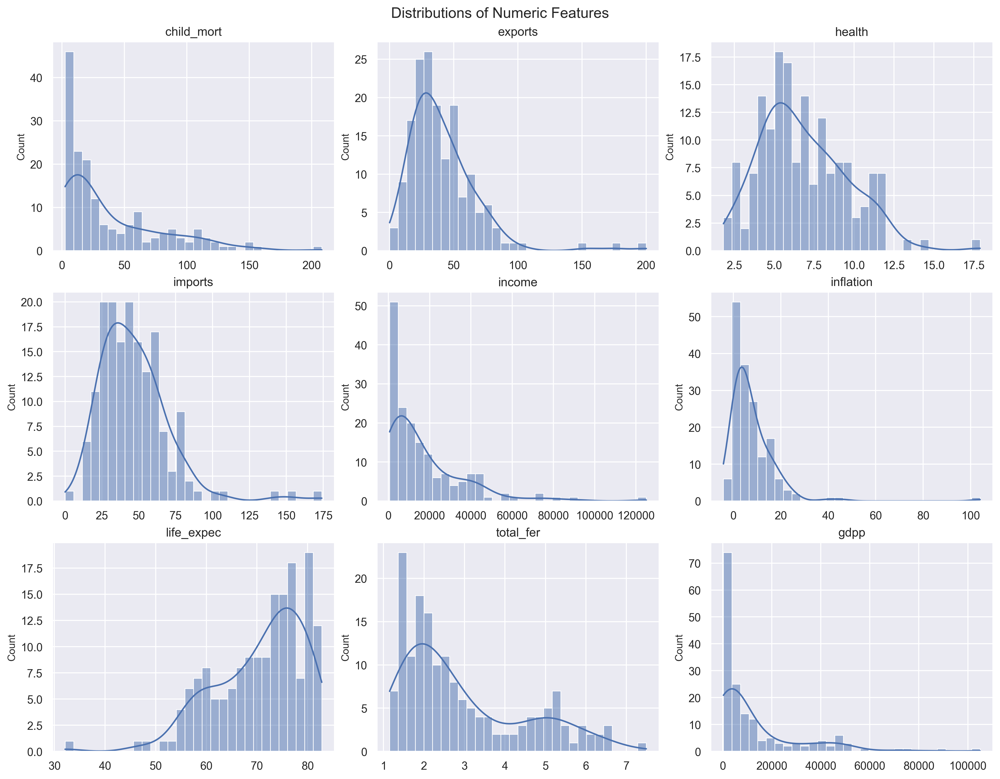


 ---------------------------------------------------------------------------------------------------------------------------------------------------------------- 

Figure saved: figs/5510_final_project/num_cols_corr.png


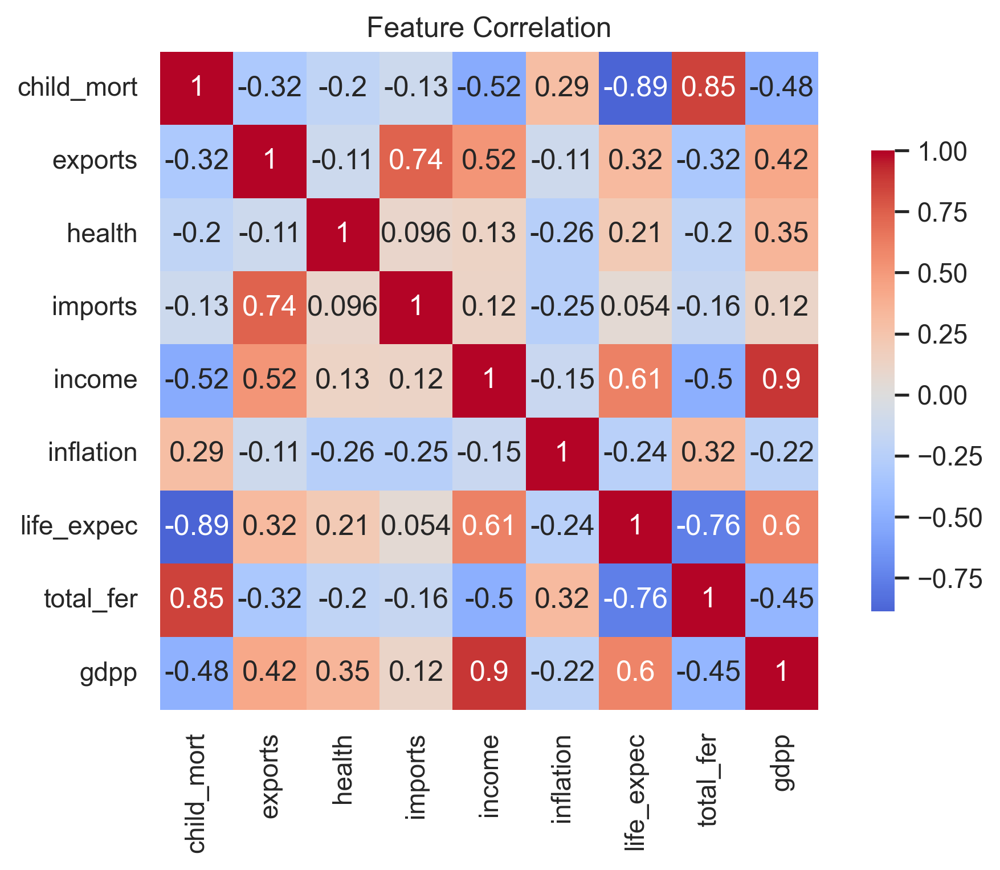


 ---------------------------------------------------------------------------------------------------------------------------------------------------------------- 

Figure saved: figs/5510_final_project/outliers.png


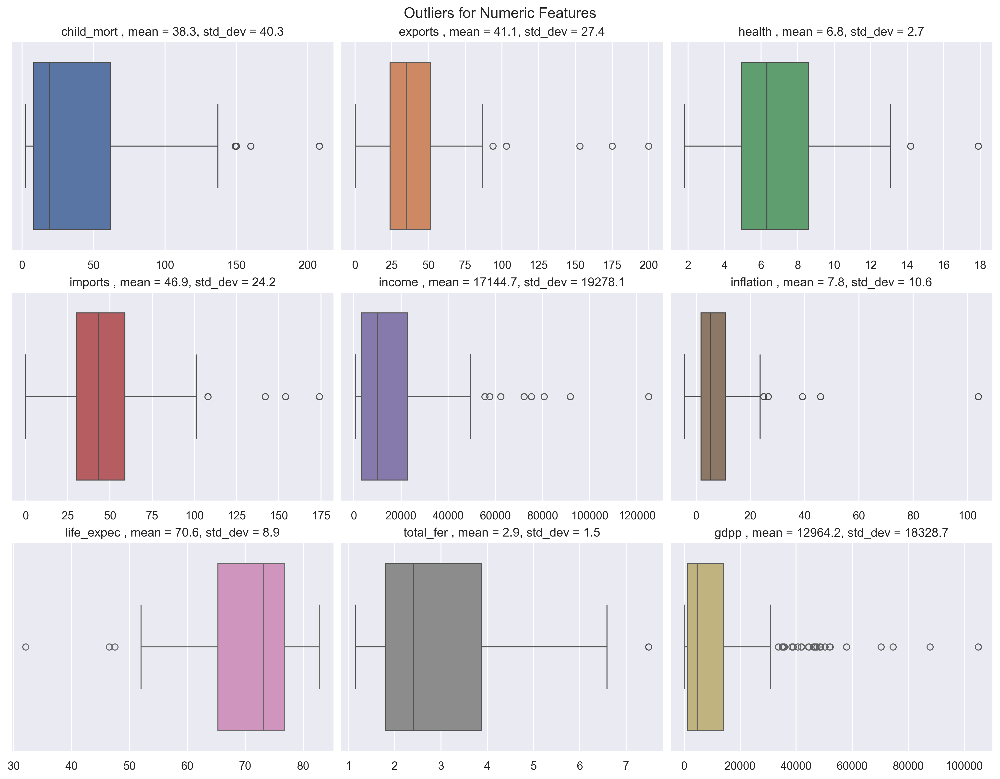


=== Outliers for child_mort ===
Total outliers: 4
                 country  child_mort outlier_type
Central African Republic       149.0 extreme_high
                    Chad       150.0 extreme_high
            Sierra Leone       160.0 extreme_high
                   Haiti       208.0 extreme_high

=== Outliers for exports ===
Total outliers: 5
   country  exports outlier_type
Seychelles     93.8 extreme_high
   Ireland    103.0 extreme_high
     Malta    153.0 extreme_high
Luxembourg    175.0 extreme_high
 Singapore    200.0 extreme_high

=== Outliers for health ===
Total outliers: 2
              country  health outlier_type
Micronesia, Fed. Sts.    14.2 extreme_high
        United States    17.9 extreme_high

=== Outliers for imports ===
Total outliers: 4
   country  imports outlier_type
Seychelles    108.0 extreme_high
Luxembourg    142.0 extreme_high
     Malta    154.0 extreme_high
 Singapore    174.0 extreme_high

=== Outliers for income ===
Total outliers: 8
             coun

In [3]:
# list the numeric columnds
num_cols = country_data.select_dtypes(include=["int", "float"]).columns.tolist()

## BASE EDA Information
display(country_data.describe())
print(f'Check for duplicates: {country_data.duplicated().sum()}')
null_nans(country_data)
section_split()

# Start with a simple pairplot - decided not to for this dataset, didn't add much value
## sns.pairplot(country_data, vars=num_cols, diag_kind="kde")
## save_figure("num_cols_pairplot")
## plt.show()

# Distributions
plot_hist(country_data)
section_split()

# Correlation heatmap
corr = country_data[num_cols].corr(numeric_only=True)
sns.heatmap(corr, cmap="coolwarm", center=0, square=True, annot=True, cbar_kws={"shrink": 0.7})
plt.title("Feature Correlation")
save_figure("num_cols_corr")
plt.show()
section_split()

# Outlier Analysis
plot_outliers(country_data)
outlier_results = identify_all_outliers(country_data)
section_split()

### EDA observations

We haven't got an issue with missing values, NaNs, nulls or duplicates.

There are very different units and scales across the features. Almost certaily, some form of normalization, min-max scaling will be needed as part of pre-processing.

The distributions of 'child_mort', 'income', 'gdpp' are heavily skewed towards zero. LIfe-expectancy is the only feature with a distribution skewed towards its maximum value.

**Correlations > 0.7**
- Life expectancy is negatively correlated with Child Mortality
- Child Mortality is positively correlated with Fertility Rate
- Income is positvely correlated with gdp per person
- Eports and imports are positively correlated
- Fertilisation rate and life expectancy are negsatively correlated

#### Outliers

There are a number of extreme outliers (in nearly all features) which may impact clustering. In particular, considering that I was intending to use a combination of PCA and k-Means Clustering, potential issues are:
1. **PCA distortion**: Outliers can dominate principal components, causing them to point toward extreme values rather than capturing true data variance
2. **Cluster centroid skewing**: K-means centroids get pulled toward outliers, creating poorly separated clusters
3. **Distance metric issues**: K-means uses Euclidean distance, which is sensitive to extreme values

**Potential Solutios to Investigate**
1. Use RobustScaler instead of StandardScaler or MInMaxScaler (works with median and IQR instead of mean and std or min and max respectively.)
2. Remove extreme outliers. For example, those with 3+ standard deviations. May not be representative of the data, so I will avoid this approach.
3. Winsorisation - Cap outliers at reasonable percentiles (e.g., 5th and 95th percentiles)
4. Log transformation - Could apply to heavily skewed features like income, gdpp
5. Alternative clustering approaches that are less sensitive to outliers: DBSCAN or Hierarchical clustering with robust linkage

**Note:** As I am uncertain of the impact of 3. Winssorisation (first time I've tried to use it), so I will create two versions of the data one with Winsorisation and one without. Then compare the cluster quality (scoring to be determined).

## 3) Preprocessing

In [4]:
class Winsorizer(BaseEstimator, TransformerMixin):
    def __init__(self, limits=None, feature_limits=None):
        """
        limits: default limits for all features
        feature_limits: dict mapping feature indices to specific limits
        """
        self.limits = limits or (0.05, 0.05)
        self.feature_limits = feature_limits or {}
        self.bounds_ = {}

    def fit(self, X, y=None):
        for i in range(X.shape[1]):
            # Use feature-specific limits if provided, otherwise use default
            current_limits = self.feature_limits.get(i, self.limits)
            lower_bound = np.percentile(X[:, i], current_limits[0] * 100)
            upper_bound = np.percentile(X[:, i], (1 - current_limits[1]) * 100)
            self.bounds_[i] = (lower_bound, upper_bound)
        return self

    def transform(self, X):
        X_winsorized = X.copy()
        for i in range(X.shape[1]):
            lower_bound, upper_bound = self.bounds_[i]
            X_winsorized[:, i] = np.clip(X_winsorized[:, i], lower_bound, upper_bound)
        return X_winsorized


Comparison of outliers for scaler_A and scaler_B:

Figure saved: figs/5510_final_project/outliers_scaled_A.png


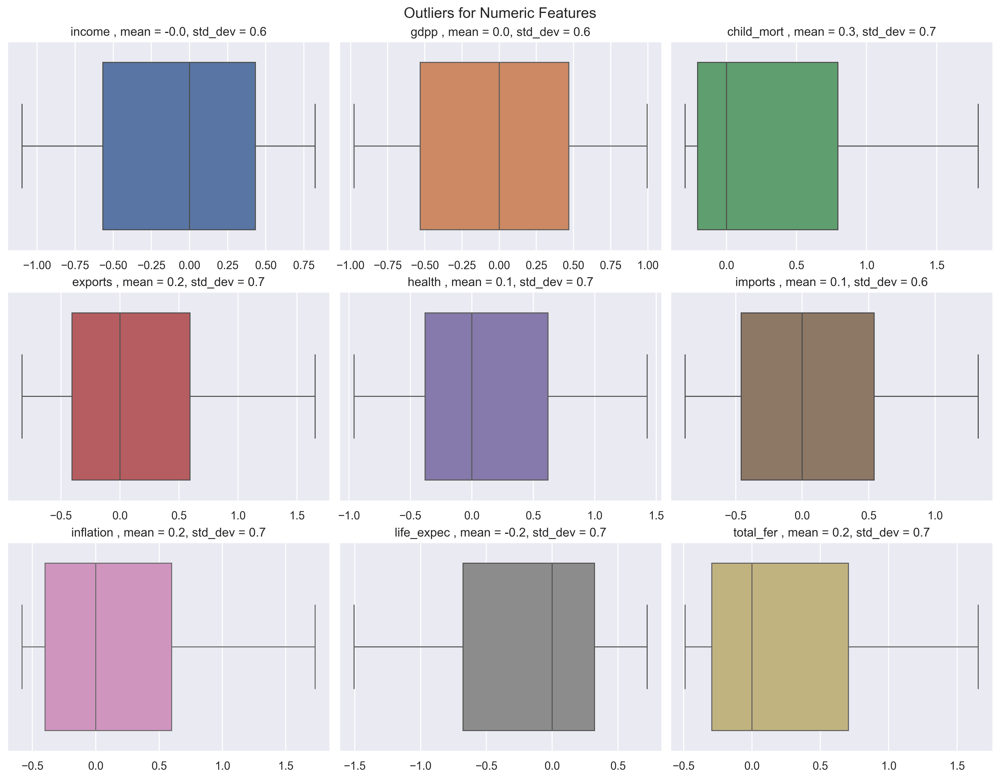

Figure saved: figs/5510_final_project/outliers_scaled_B.png


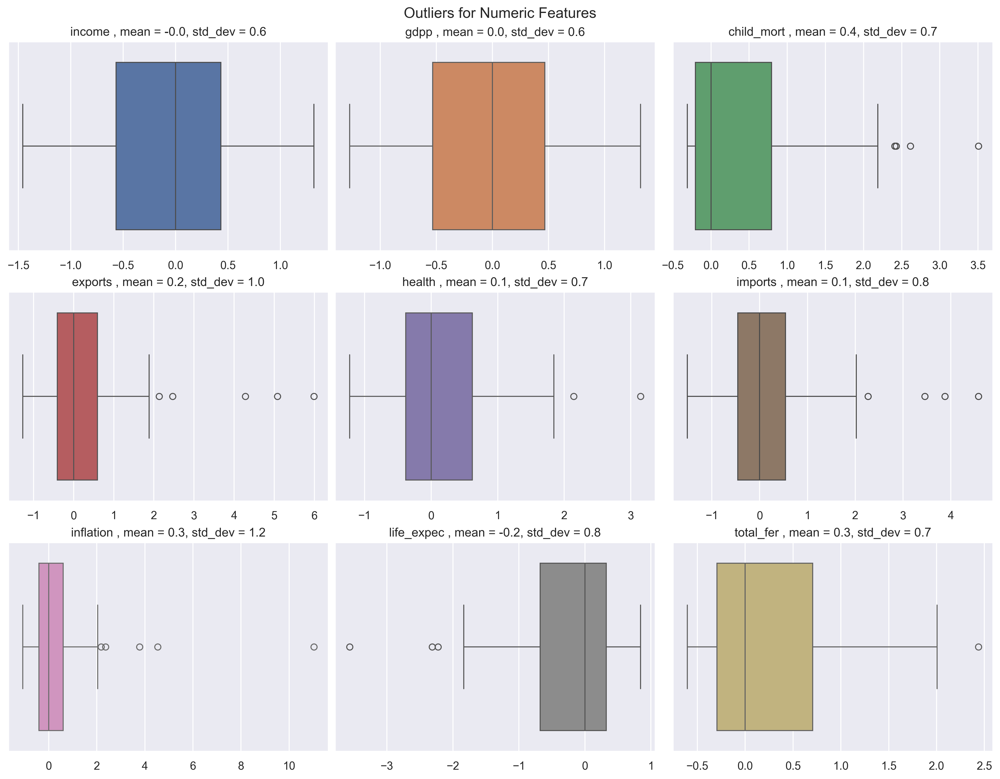

In [5]:
# Initially thought I might want to play with the limits on a per-feature basis, but I think it's better to just use the same limits for all features.'
feature_limits = {
    0: (0.05, 0.05), # child_mort
    1: (0.05, 0.05), # exports
    2: (0.05, 0.05), # health
    3: (0.05, 0.05), # imports
    4: (0.05, 0.05), # Income
    5: (0.05, 0.05), # Inflation
    6: (0.05, 0.05), # life_expectancy
    7: (0.05, 0.05), # total_fer
    8: (0.05, 0.05), # gdpp
}

def log_transform_safe(X):
    """Apply log1p transformation safely"""
    return np.log1p(np.maximum(X, 0))

# Create column transformer for selective log transformation
log_cols = ['income', 'gdpp']
other_cols = [col for col in num_cols if col not in log_cols]

column_transformer = ColumnTransformer([
    ('log_transform', FunctionTransformer(log_transform_safe), log_cols),
    ('passthrough', 'passthrough', other_cols)
], remainder='drop')

# PIpelne A with full outlier handling
scaler_A = Pipeline([
    ('log_transform', column_transformer),
    ('winsorizer', Winsorizer(feature_limits=feature_limits)),
    ('scaler', RobustScaler())
])

# Pipeline B with no Winsorisation
scaler_B = Pipeline([
    ('log_transform', column_transformer),
    ('scaler', RobustScaler())
])

# Get the correct feature order after transformation
transformed_feature_names = log_cols + other_cols

scaled_A = scaler_A.fit_transform(country_data[num_cols])
scaled_A_df = pd.DataFrame(scaled_A, columns=transformed_feature_names , index=country_data.index)

scaled_B = scaler_B.fit_transform(country_data[num_cols])
scaled_B_df = pd.DataFrame(scaled_B, columns=transformed_feature_names , index=country_data.index)

print("Comparison of outliers for scaler_A and scaler_B:\n")
plot_outliers(scaled_A_df, filename="outliers_scaled_A")
plot_outliers(scaled_B_df, filename="outliers_scaled_B")

## 4) Modelling
Now that we have two scaled datasets, we can try various approaches to clustering.
1) Interpret and understanding the PCA components (using scaled_A which includes outlier treatment)
2) Optimese the Number of Clusters and interpret cluster results
3) Re-run the cluster pipeline with the alternative scaling approach (scaled_B), to check the impact.
4) Try DBScan as an alternative
4) Try Hierarchical Clustering for comparison

Evaluation and Interpretation of these steps is key. My main objective is to compare performance and discover country groupings within the dataset.

### With scaled_A
I am going to assume that the best results will come using scaled_A, as this is the dataset with the most outliers removed. Then I will check the best clustering results using scaled_B.


### PCA Interpretation
Before clustering, I want to take some time to produce and understand the principal components that will be used in the clustering pipeline.

PCA Component Loadings:


,PC1,PC2,PC3,PC4
income,0.382,0.001,0.207,0.116
gdpp,0.386,-0.043,0.131,0.159
child_mort,-0.429,0.075,-0.095,0.073
exports,0.253,0.715,0.012,0.175
health,0.152,-0.385,-0.530,0.705
imports,0.093,0.536,-0.498,0.068
inflation,-0.215,0.146,0.616,0.626
life_expec,0.442,-0.143,0.134,-0.056
total_fer,-0.428,0.069,-0.061,0.169



Explained Variance Ratio:
PC1: 0.520 (52.0%)
PC2: 0.165 (16.5%)
PC3: 0.150 (15.0%)
PC4: 0.074 (7.4%)

Cumulative Explained Variance: 0.910
Figure saved: figs/5510_final_project/pca_loadings_top_4.png


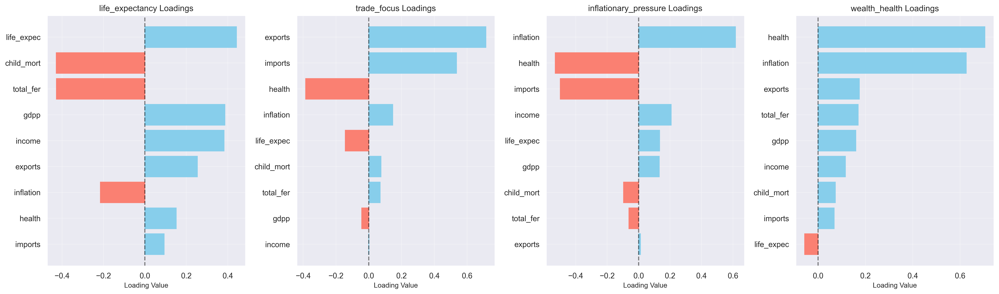

In [6]:
def interpret_pca_components(pca, original_features):
    # Interpret PCA components by analyzing feature loadings

    # Get the components (loadings)
    components = pca.components_
    n_components = components.shape[0]

    # Create a DataFrame for easier interpretation
    loadings_df = pd.DataFrame(
        components.T,
        columns=[f'PC{i+1}' for i in range(n_components)],
        index=original_features
    )

    print("PCA Component Loadings:")
    print("=" * 50)
    display(loadings_df.round(3))

    # Explained variance ratio
    print(f"\nExplained Variance Ratio:")
    for i, var_ratio in enumerate(pca.explained_variance_ratio_[:n_components]):
        print(f"PC{i+1}: {var_ratio:.3f} ({var_ratio*100:.1f}%)")

    print(f"\nCumulative Explained Variance: {pca.explained_variance_ratio_[:n_components].sum():.3f}")

    return loadings_df

def plot_pca_loadings(loadings_df):
    # Plot PCA loadings for the first n components
    n_components = loadings_df.shape[1]

    fig, axes = plt.subplots(1, n_components, figsize=(5*n_components, 6))

    for i in range(n_components):
        pc = f'PC{i+1}'
        loadings = loadings_df[pc].sort_values(key=abs, ascending=True)

        # Create horizontal bar plot
        bars = axes[i].barh(range(len(loadings)), loadings.values)

        # Color bars based on positive/negative
        for j, bar in enumerate(bars):
            if loadings.values[j] >= 0:
                bar.set_color('skyblue')
            else:
                bar.set_color('salmon')

        axes[i].set_yticks(range(len(loadings)))
        axes[i].set_yticklabels(loadings.index)
        axes[i].set_xlabel('Loading Value')
        title = f'{pca_names[i]} Loadings'
        axes[i].set_title(title)
        axes[i].axvline(x=0, color='black', linestyle='--', alpha=0.5)
        axes[i].grid(True, alpha=0.3)

    plt.tight_layout()
    save_figure(f'pca_loadings_top_{n_components}')
    plt.show()
    return

pca_fitted = PCA(n_components=0.9).fit(scaled_A)
pca_data = pca_fitted.transform(scaled_A)

loadings_df = interpret_pca_components(pca_fitted, transformed_feature_names)

# See next markdown cell for explanation.
pca_names = {
    0: 'life_expectancy',
    1: 'trade_focus',
    2: 'inflationary_pressure',
    3: 'wealth_health'
}

plot_pca_loadings(loadings_df)

_Note: I found this interpretation hard, something I need to practice. But, without it, the PCA has limited value._

#### PC1 (var exp = 52%)
PC1 represents the development divide emphasising the difference in life expectancy.
- High positive loadings for life expectancy, gdpp, income and exports.
- Negative loadings for child mortality, fertility rate and inflation

Countries with high fertility and high child mortality, score low, while those with higher incomes and GDP per capita, and longer life expectancy score high.

**NAME: life_expectancy**

#### PC2 (var exp = 16.5%)
PC2 represents trade focus.
- Positive loadings: Imports, exports, slight boost from life expectancy and health.
- Negative loadings: health and life expectancy.

This axis reflects a macro-economic trade dimension. Countries with higher import and export scores load positively, while those with higher health, life expectancy score lower

PC2 contrasts trade focus with health impact

**NAME: trade_focus**

#### PC3 (var exp = 15%)
PC3 represents impact of inflationary policies.
- Positive loadings: inflation (very strong), income, life expectancy, gdpp
- Negative loadings: health, imports, child mortality

Self-sufficiency (low imports) with high inflation but reasonable incomes score positively. High health spending and high imports score negatively

**NAME: inflationary_pressure**

#### PC4 (var exp = 7.4%)
PC4 represents prosperity and longevity.
- Positive loadings: health, inflation, exports, fertility, gdoo
- Negative loadings: life expectancy (very weak).

This dimension highlights impacts of wealth in developed nations. Countries with higher health spending, trade and incomes/gdpp score highly, while long life expectancy countries load slightly negatively.

**NAME: wealth_health**


### How many clusters is optimal?

Now that we have meaningful components, we can create explainable clusters, the first step being to decide how many. The obvious method would be to apply some form of scoring and compare scores at various values of k - number of clusters. I took AI Assistance in discovering the options and creating a plot grid quickly. Here are the scoring options I investigated with a quick summary of what they mean and how they can be used:

**1) Inertia (a.k.a. Within-Cluster Sum of Squares, WCSS)**

* **What it is:** The sum of squared distances of samples to their nearest cluster center.
* **How to use:** Lower inertia means tighter, more compact clusters. Plot inertia vs. *k* (the **Elbow Method**).
* **Caution:** Always decreases as *k* increases, so not useful alone — must be combined with visual inspection.

**2) Silhouette Score**

* **What it is:** Measures how similar a sample is to its own cluster compared to other clusters. Ranges from -1 (bad) to +1 (ideal).
* **How to use:** Higher is better. Average silhouette score across all samples helps identify the *k* that balances cohesion and separation.
* **Caution:** Can be biased toward convex/spherical clusters; less reliable for uneven cluster shapes.

**3) Calinski–Harabasz Index (a.k.a. Variance Ratio Criterion)**

* **What it is:** Ratio of between-cluster dispersion to within-cluster dispersion.
* **How to use:** Higher values indicate better-defined clusters. Compare across *k* — a peak suggests a natural cluster number.
* **Caution:** Tends to favor larger numbers of clusters if there are substructures.

**4) Davies–Bouldin Index**

* **What it is:** Measures average “similarity” between each cluster and its most similar one (based on intra-cluster vs. inter-cluster distances).
* **How to use:** Lower values indicate more distinct and better-separated clusters. Compare across *k* — look for the minimum.
* **Caution:** Sensitive to noisy data and uneven cluster sizes.


Figure saved: figs/5510_final_project/kmeans_optimization_comprehensive.png


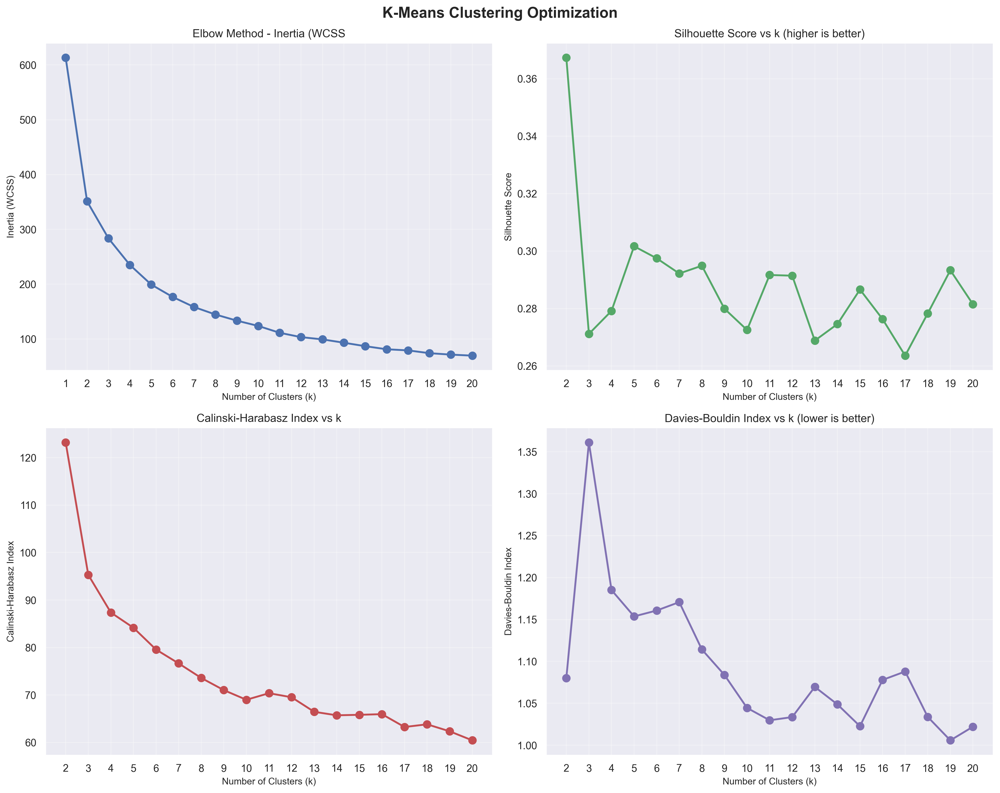

Cluster Optimization Summary:
Optimal k based on Silhouette Score: 2
Optimal k based on Calinski-Harabasz: 2
Optimal k based on Davies-Bouldin: 19


In [7]:
def evaluate_kmeans_clusters(pca_data, k_range=range(1, 21), random_state=SEED):
    """
    Evaluate K-means clustering for different values of k
    Returns metrics for elbow method analysis
    """
    results = {
        'k': [],
        'inertia': [],
        'silhouette_score': [],
        'calinski_harabasz': [],
        'davies_bouldin': []
    }

    for k in k_range:
        # Create and fit model with current k
        kmeans =  KMeans(n_clusters=k, random_state=random_state, n_init=10).fit(pca_data)
        labels = kmeans.labels_

        # Store results
        results['k'].append(k)
        results['inertia'].append(kmeans.inertia_)

        # Silhouette score (skip for k=1)
        if k > 1:
            results['silhouette_score'].append(silhouette_score(pca_data, labels))
            results['calinski_harabasz'].append(calinski_harabasz_score(pca_data, labels))
            results['davies_bouldin'].append(davies_bouldin_score(pca_data, labels))
        else:
            results['silhouette_score'].append(np.nan)
            results['calinski_harabasz'].append(np.nan)
            results['davies_bouldin'].append(np.nan)

    return results

def plot_elbow_charts(results, save_plots=True):
    # Plot comprehensive elbow method charts
    fig, axes = plt.subplots(2, 2, figsize=(15, 12))
    fig.suptitle('K-Means Clustering Optimization', fontsize=16, fontweight='bold')

    # 1. Inertia (WCSS) - Traditional Elbow Method
    axes[0, 0].plot(results['k'], results['inertia'], 'bo-', linewidth=2, markersize=8)
    axes[0, 0].set_xlabel('Number of Clusters (k)')
    axes[0, 0].set_ylabel('Inertia (WCSS)')
    axes[0, 0].set_title('Elbow Method - Inertia (WCSS')
    axes[0, 0].grid(True, alpha=0.3)
    axes[0, 0].set_xticks(results['k'])

    # 2. Silhouette Score
    k_values = [k for k, score in zip(results['k'], results['silhouette_score']) if not np.isnan(score)]
    silhouette_values = [score for score in results['silhouette_score'] if not np.isnan(score)]

    axes[0, 1].plot(k_values, silhouette_values, 'go-', linewidth=2, markersize=8)
    axes[0, 1].set_xlabel('Number of Clusters (k)')
    axes[0, 1].set_ylabel('Silhouette Score')
    axes[0, 1].set_title('Silhouette Score vs k (higher is better)')
    axes[0, 1].grid(True, alpha=0.3)
    axes[0, 1].set_xticks(k_values)

    # 3. Calinski-Harabasz Index
    ch_values = [score for score in results['calinski_harabasz'] if not np.isnan(score)]
    axes[1, 0].plot(k_values, ch_values, 'ro-', linewidth=2, markersize=8)
    axes[1, 0].set_xlabel('Number of Clusters (k)')
    axes[1, 0].set_ylabel('Calinski-Harabasz Index')
    axes[1, 0].set_title('Calinski-Harabasz Index vs k')
    axes[1, 0].grid(True, alpha=0.3)
    axes[1, 0].set_xticks(k_values)

    # 4. Davies-Bouldin Index (lower is better)
    db_values = [score for score in results['davies_bouldin'] if not np.isnan(score)]
    axes[1, 1].plot(k_values, db_values, 'mo-', linewidth=2, markersize=8)
    axes[1, 1].set_xlabel('Number of Clusters (k)')
    axes[1, 1].set_ylabel('Davies-Bouldin Index')
    axes[1, 1].set_title('Davies-Bouldin Index vs k (lower is better)')
    axes[1, 1].grid(True, alpha=0.3)
    axes[1, 1].set_xticks(k_values)

    plt.tight_layout()
    if save_plots:
        save_figure('kmeans_optimization_comprehensive')
    plt.show()

    # Print summary
    print("Cluster Optimization Summary:")
    print("=" * 50)

    # Find optimal k for each metric
    optimal_silhouette = k_values[np.argmax(silhouette_values)]
    optimal_ch = k_values[np.argmax(ch_values)]
    optimal_db = k_values[np.argmin(db_values)]

    print(f"Optimal k based on Silhouette Score: {optimal_silhouette}")
    print(f"Optimal k based on Calinski-Harabasz: {optimal_ch}")
    print(f"Optimal k based on Davies-Bouldin: {optimal_db}")
    return

# Run the evaluation
cluster_results = evaluate_kmeans_clusters(pca_data, k_range=range(1, 21))
# Create the plots
plot_elbow_charts(cluster_results)

### Interpretation and Decision on Number of Clusters
Reading straight from the charts, 2 seems to be the optimal number of clusters for this dataset. However, that is quite uninteresting, it shows a separation of developed and developing nations along the development_gradient (pca1). This hardly seems insightful.

The next most optimal value for k seems to be 5.
- Inertia / WCSS: on the right-hand side of the elbow.
- Silhouette Score: 0.3 (how similar sample is to its own cluster compared to other clusters) is the second-highest value and compares well to neighbouring k-values.
- Calinski-Harabasz: 85 (between cluster dispersion and within cluster dispersion) doesn't add much understanding here.
- Davies-Bouldin: 1.15  (average similarity between each cluster and its most similar one) Dips a little at 5 compared to 4 or 6, for this metric lower is better.

**Let's proceed with k = 5.**


Figure saved: figs/5510_final_project/kMeans_pca_plot.png


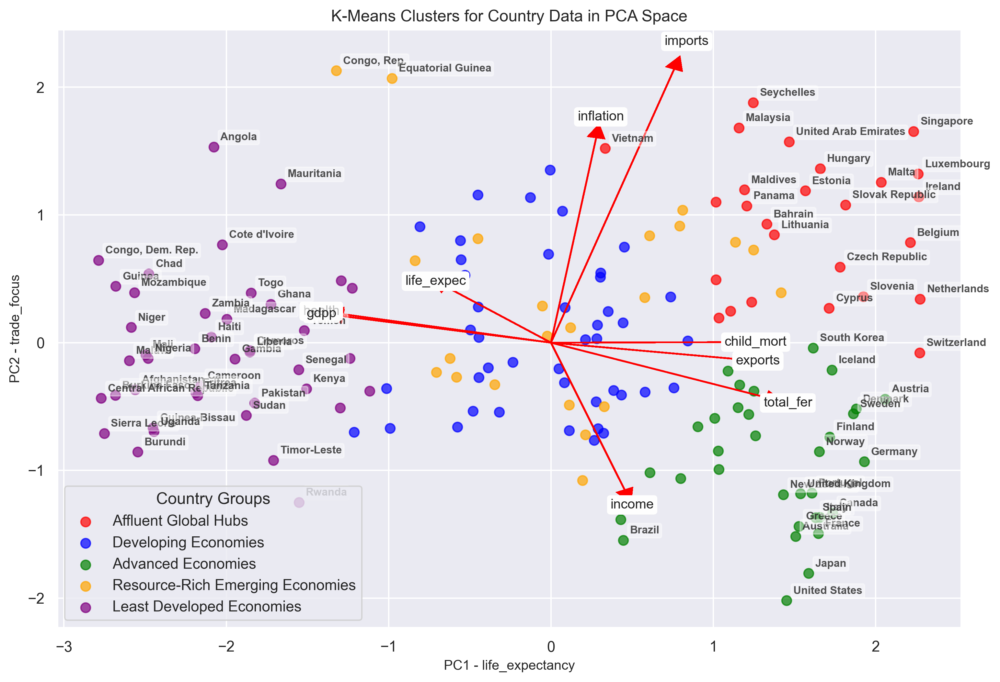

In [8]:
optimal_k = 5

kMeans_optimal = KMeans(n_clusters=optimal_k, random_state=SEED, n_init=10).fit(pca_data)

# Note: these names are explained in markdown below, defined as a dictionary here to facilitate use in code and graphics.
cluster_names = {
    0: "Affluent Global Hubs",
    1: "Developing Economies",
    2: "Advanced Economies",
    3: "Resource-Rich Emerging Economies",
    4: "Least Developed Economies"
}


def pca_plot(kMeans, pca_data, cluster_names = cluster_names, pc1 = 0, pc2 = 1, filename = 'kMeans pca_plot'):

    labels = kMeans.labels_
    unique_labels = np.unique(labels)

    fig, ax = plt.subplots(figsize=(12, 8))
    # deviating from sns.cmap for better visible separation of clusters
    colours = ['red', 'blue', 'green', 'orange', 'purple'][:len(unique_labels)]

    for i, label in enumerate(unique_labels):
        mask = labels == label
        cluster_name = cluster_names.get(label, f'Cluster {label}')
        ax.scatter(pca_data[mask, 0], pca_data[mask, 1],
                   c=[colours[i]], label=cluster_name, alpha=0.7, s=50)

    # Label only countries that are far from the center or at extremes
    for i, country in enumerate(country_data['country']):
        x, y = pca_data[i, 0], pca_data[i, 1]

        # Label if point is far from origin or at extremes
        distance_from_origin = np.sqrt(x**2 + y**2)
        if (distance_from_origin > 1.5 or
            abs(x) > 2 or abs(y) > 1.5):
            ax.annotate(country, (x, y),
                        xytext=(5, 5), textcoords='offset points',
                        fontsize=8, fontweight='bold', alpha=0.8,
                        bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.4))

            # Plot feature vectors (loadings)
        loadings = pca_fitted.components_
        scaling_factor = 3  # Adjust this to make arrows visible

        for i, feature in enumerate(num_cols):
            ax.arrow(0, 0,
                    loadings[pc1, i] * scaling_factor,
                    loadings[pc2, i] * scaling_factor,
                    head_width=0.1, head_length=0.1,
                    fc='red', ec='red', alpha=0.7)
            ax.text(loadings[pc1, i] * scaling_factor * 1.1,
                    loadings[pc2, i] * scaling_factor * 1.1,
                    feature, fontsize=10, ha='center', va='center',
                    bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.7))

    plt.xlabel(f'PC1 - {pca_names[0]}')
    plt.ylabel(f'PC2 - {pca_names[1]}')
    plt.title('K-Means Clusters for Country Data in PCA Space')
    plt.legend(title='Country Groups', loc='best')
    save_figure(filename)
    plt.show()
    return

pca_plot(kMeans = kMeans_optimal, pca_data = pca_data, pc1 = 0, pc2 = 1)

Clusters 1 and 3 (Developing Economies and Resource-Rich Emerging Economies) are not well separated using PC1 and PC2. By checking the same plot for all combinations of Principal Component we may be able to see more clearly how they are differentiated.

Figure saved: figs/5510_final_project/pca_combos_scaled_A.png


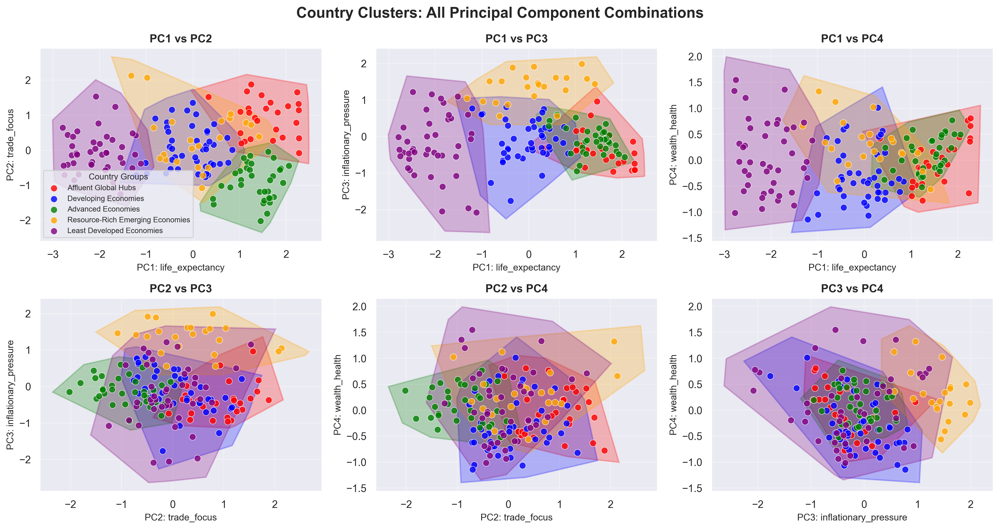

In [9]:
def plot_all_pca_combinations_with_hulls(pca_data, labels, cluster_names=None, n_components=4, expansion=0.3, filename="pca_combos"):
    """
    Plot all combinations of principal components with expanded convex hulls
    """

    # Generate all combinations of 2 components from n_components
    combinations_list = list(combinations(range(n_components), 2))
    n_plots = len(combinations_list)

    # Calculate subplot layout
    n_cols = 3
    n_rows = (n_plots + n_cols - 1) // n_cols

    fig, axes = plt.subplots(n_rows, n_cols, figsize=(5*n_cols, 4*n_rows))
    fig.suptitle('Country Clusters: All Principal Component Combinations', fontsize=16, fontweight='bold')

    # Flatten axes array for easier indexing
    if n_rows == 1:
        axes = [axes] if n_cols == 1 else axes
    else:
        axes = axes.flatten()

    unique_labels = np.unique(labels)
    colours = ['red', 'blue', 'green', 'orange', 'purple'][:len(unique_labels)]

    for plot_idx, (pc_x, pc_y) in enumerate(combinations_list):
        ax = axes[plot_idx]

        # Plot expanded hulls first (background)
        for i, label in enumerate(unique_labels):
            mask = labels == label
            cluster_points = pca_data[mask][:, [pc_x, pc_y]]

            if len(cluster_points) >= 3:
                try:
                    # Calculate cluster center
                    center = np.mean(cluster_points, axis=0)

                    # Create convex hull
                    hull = ConvexHull(cluster_points)
                    hull_points = cluster_points[hull.vertices]

                    # Expand hull points outward from center
                    expanded_points = []
                    for point in hull_points:
                        direction = point - center
                        expanded_point = center + direction * (1 + expansion)
                        expanded_points.append(expanded_point)

                    expanded_points = np.array(expanded_points)

                    # Create expanded polygon
                    polygon = patches.Polygon(expanded_points,
                                            closed=True,
                                            alpha=0.25,
                                            facecolor=colours[i],
                                            edgecolor=colours[i],
                                            linewidth=1.5)
                    ax.add_patch(polygon)

                except:
                    # Fallback to circle if hull fails
                    center = np.mean(cluster_points, axis=0)
                    distances = np.sqrt(np.sum((cluster_points - center)**2, axis=1))
                    radius = np.percentile(distances, 80) * (1 + expansion)

                    circle = plt.Circle(center, radius, alpha=0.25, facecolor=colours[i],
                                      edgecolor=colours[i], linewidth=1.5)
                    ax.add_patch(circle)

        # Plot points on top
        for i, label in enumerate(unique_labels):
            mask = labels == label
            cluster_name = cluster_names.get(label, f'Cluster {label}') if cluster_names else f'Cluster {label}'

            # Only show legend on first plot to avoid clutter
            label_text = cluster_name if plot_idx == 0 else ""

            ax.scatter(pca_data[mask, pc_x], pca_data[mask, pc_y],
                      c=colours[i], label=label_text,
                      alpha=0.8, s=50, edgecolors='white', linewidth=0.5)

        # Customize each subplot
        pc_x_name = pca_names.get(pc_x, f'PC{pc_x+1}')
        pc_y_name = pca_names.get(pc_y, f'PC{pc_y+1}')

        ax.set_xlabel(f'PC{pc_x+1}: {pc_x_name}', fontsize=10)
        ax.set_ylabel(f'PC{pc_y+1}: {pc_y_name}', fontsize=10)
        ax.set_title(f'PC{pc_x+1} vs PC{pc_y+1}', fontsize=12, fontweight='bold')
        ax.grid(True, alpha=0.3)

        # Add legend only to first subplot
        if plot_idx == 0:
            ax.legend(title='Country Groups', loc='best', fontsize=8, title_fontsize=9)

    # Hide unused subplots
    for j in range(n_plots, len(axes)):
        axes[j].set_visible(False)

    plt.tight_layout()
    save_figure(filename)
    plt.show()

# Usage - plots all combinations of first 4 components
plot_all_pca_combinations_with_hulls(pca_data, labels = kMeans_optimal.labels_, cluster_names=cluster_names, n_components=4, expansion=0.3, filename='pca_combos_scaled_A')

PC1(life_expectancy) combined with PC2(trade_focus) does a good job of separating clusters 0, 2, 4 and (1&3 combined). It's clear now that the difference between clusters 1 and 3 has something to do with PC3(inflationary_pressure). The other components don't seem to be very useful for separating clusters.

To crystalise thinking, let's look at the details.

In [10]:
def analyze_clusters(pca_data, labels, country_data, features_to_analyze=None):
    """
    Comprehensive analysis to determine meaningful cluster names from visual patterns
    """
    if features_to_analyze is None:
        features_to_analyze = transformed_feature_names

    # Add cluster labels to country data
    analysis_df = country_data.copy()
    analysis_df['Cluster'] = labels

    unique_labels = sorted(np.unique(labels))

    # Show cluster sizes
    cluster_counts = analysis_df['Cluster'].value_counts().sort_index()
    print(f"\nCLUSTER SIZES:")
    print("-" * 50)
    for cluster, count in cluster_counts.items():
        print(f"Cluster {cluster}: {count} countries")

    # 1. Analyze cluster positions in PC space
    print("\nCLUSTER POSITIONS IN PCA SPACE:")
    print("-" * 50)

    cluster_positions = {}
    for label in unique_labels:
        mask = labels == label
        cluster_center = np.mean(pca_data[mask], axis=0)
        cluster_positions[label] = cluster_center

        print(f"Cluster {label}:")
        print(f"  PC1 ({pca_names[0]}): {cluster_center[0]:+.2f}")
        print(f"  PC2 ({pca_names[1]}): {cluster_center[1]:+.2f}")
        print(f"  PC3 ({pca_names[2]}): {cluster_center[2]:+.2f}")
        print(f"  PC4 ({pca_names[3]}): {cluster_center[3]:+.2f}")
        print()

    # 2. Rank clusters by development level (PC1)
    development_ranking = sorted(cluster_positions.items(), key=lambda x: x[1][0])

    print("📊 DEVELOPMENT RANKING (PC1 - most positive = most developed):")
    print("-" * 60)
    for rank, (label, position) in enumerate(development_ranking):
        pc1_score = position[0]
        development_level = "Least Developed" if rank == 0 else "Most Developed" if rank == len(development_ranking)-1 else f"Mid-Level ({rank+1}/{len(development_ranking)})"
        print(f"{rank+1}. Cluster {label}: PC1 = {pc1_score:+.2f} → {development_level}")

    # 3. Analyze actual country characteristics
    print(f"\n ACTUAL ECONOMIC CHARACTERISTICS BY CLUSTER:")
    print("-" * 55)

    cluster_characteristics = {}
    for label in unique_labels:
        mask = analysis_df['Cluster'] == label
        cluster_data = analysis_df[mask]

        characteristics = {
            'avg_income': cluster_data['income'].mean(),
            'avg_gdpp': cluster_data['gdpp'].mean(),
            'avg_life_exp': cluster_data['life_expec'].mean(),
            'avg_child_mort': cluster_data['child_mort'].mean(),
            'avg_health': cluster_data['health'].mean(),
            'size': len(cluster_data),
            'countries': cluster_data['country'].tolist()
        }
        cluster_characteristics[label] = characteristics

        print(f"\nCluster {label} ({characteristics['size']} countries):")
        print(f"  💵 Average Income: ${characteristics['avg_income']:,.0f}")
        print(f"  📈 Average GDP/person: ${characteristics['avg_gdpp']:,.0f}")
        print(f"  ❤️  Life Expectancy: {characteristics['avg_life_exp']:.1f} years")
        print(f"  👶 Child Mortality: {characteristics['avg_child_mort']:.1f} per 1000")
        print(f"  🏥 Health Spending: {characteristics['avg_health']:.1f}%")

        # Show notable countries
        high_income_countries = cluster_data.nlargest(3, 'income')['country'].tolist()
        print(f"  🌍 Notable countries: {', '.join(high_income_countries)}")



    # Sort clusters by income for naming
    income_sorted = sorted(cluster_characteristics.items(),
                          key=lambda x: x[1]['avg_income'], reverse=True)

    return

# Run the comprehensive analysis
analyze_clusters(pca_data, kMeans_optimal.labels_, country_data)


CLUSTER SIZES:
--------------------------------------------------
Cluster 0: 26 countries
Cluster 1: 43 countries
Cluster 2: 34 countries
Cluster 3: 22 countries
Cluster 4: 42 countries

CLUSTER POSITIONS IN PCA SPACE:
--------------------------------------------------
Cluster 0:
  PC1 (life_expectancy): +1.57
  PC2 (trade_focus): +0.94
  PC3 (inflationary_pressure): -0.38
  PC4 (wealth_health): -0.02

Cluster 1:
  PC1 (life_expectancy): -0.05
  PC2 (trade_focus): +0.05
  PC3 (inflationary_pressure): -0.12
  PC4 (wealth_health): -0.31

Cluster 2:
  PC1 (life_expectancy): +1.36
  PC2 (trade_focus): -0.92
  PC3 (inflationary_pressure): -0.13
  PC4 (wealth_health): +0.11

Cluster 3:
  PC1 (life_expectancy): +0.07
  PC2 (trade_focus): +0.34
  PC3 (inflationary_pressure): +1.35
  PC4 (wealth_health): +0.31

Cluster 4:
  PC1 (life_expectancy): -2.06
  PC2 (trade_focus): -0.07
  PC3 (inflationary_pressure): -0.25
  PC4 (wealth_health): +0.07

📊 DEVELOPMENT RANKING (PC1 - most positive = most

### Resulting Cluster Naming

Cluster 0 → “Affluent Global Hubs”
- Very high income, globally integrated (imports/exports heavy).
- Strong health outcomes, high life expectancy.
- Examples: Luxembourg, Singapore, UAE.

Cluster 2 → “Advanced Economies”
- Classic developed nations with high GDP, high health spending, long life expectancy.
- Examples: US, Norway, Denmark.

Cluster 3 → “Resource-Rich Emerging States”
- High average incomes but weaker social indicators (higher child mortality, lower health spending).
- Reliant on natural resources (oil/gas wealth) and subject to high-inflation
- Examples: Qatar, Kuwait, Brunei.

Cluster 1 → “Developing Economies”
- Lower-middle income, moderate life expectancy, improving but uneven health/development outcomes.
- Examples: Romania, Botswana, Bangladesh.

Cluster 4 → “Least Developed Countries”
- Lowest income, lowest life expectancy, highest child mortality.
- Facing structural poverty and health challenges.
- Examples: Angola, Nigeria, Yemen.

### A Check with scaled B - do outliers have a profound effect on clustering?

Figure saved: figs/5510_final_project/pca_plot_scaled_B.png


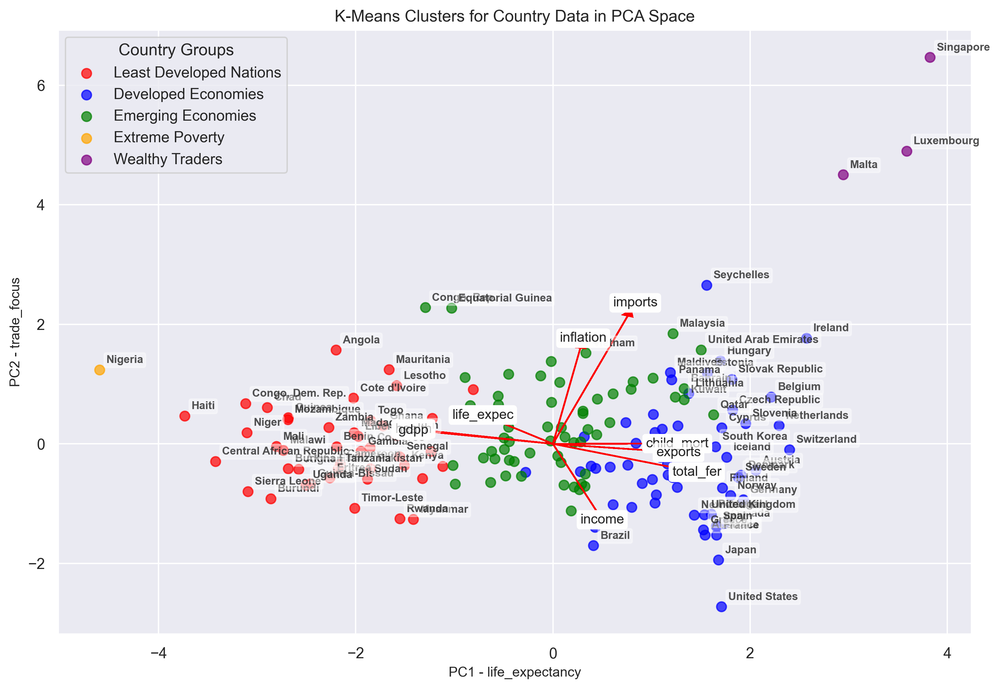

Figure saved: figs/5510_final_project/pca_combos_scaled_B.png


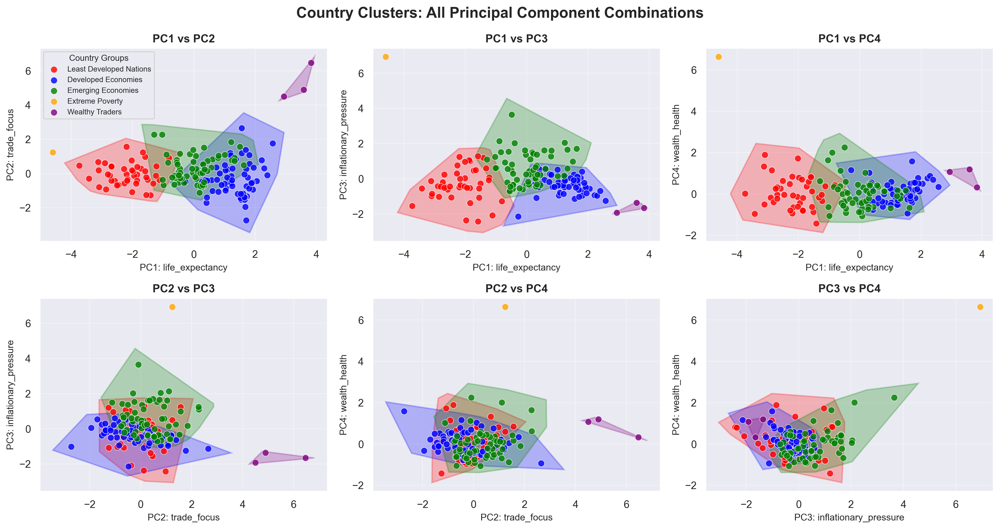

In [11]:
pca_fitted_B = PCA(n_components=0.9).fit(scaled_B)
pca_data_B = pca_fitted.transform(scaled_B)
kMeans_optimal_B = KMeans(n_clusters=optimal_k, random_state=SEED, n_init=10).fit(pca_data_B)
cluster_names_B = {
    0: "Least Developed Nations",
    1: "Developed Economies",
    2: "Emerging Economies",
    3: "Extreme Poverty",
    4: "Wealthy Traders"
}

pca_plot(kMeans = kMeans_optimal_B, pca_data = pca_data_B, cluster_names=cluster_names_B, pc1 = 0, pc2 = 1, filename='pca_plot_scaled_B')
plot_all_pca_combinations_with_hulls(pca_data_B, labels = kMeans_optimal_B.labels_, cluster_names=cluster_names_B, n_components=4, expansion=0.3, filename='pca_combos_scaled_B')

#### Notes on Model without Winsorization

The extremes are such that the five cluster model doesn't fit the data anymore. Extreme poverty (Niger) and Extreme trade/health/wealth (Singapore, Luxembourg, Malta) hide the differentiation amongst other countries.

Maybe reducing to a 3 cluster model would make sense for this data.

Figure saved: figs/5510_final_project/pca_plot_kMeans_3.png


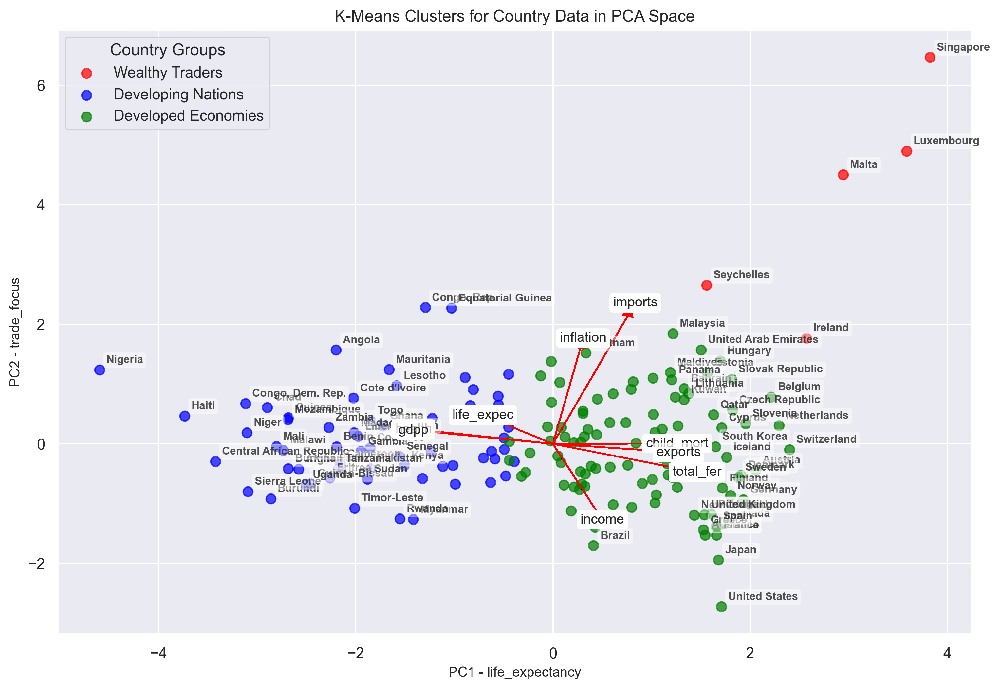

Figure saved: figs/5510_final_project/pca_combos_kMeans_3.png


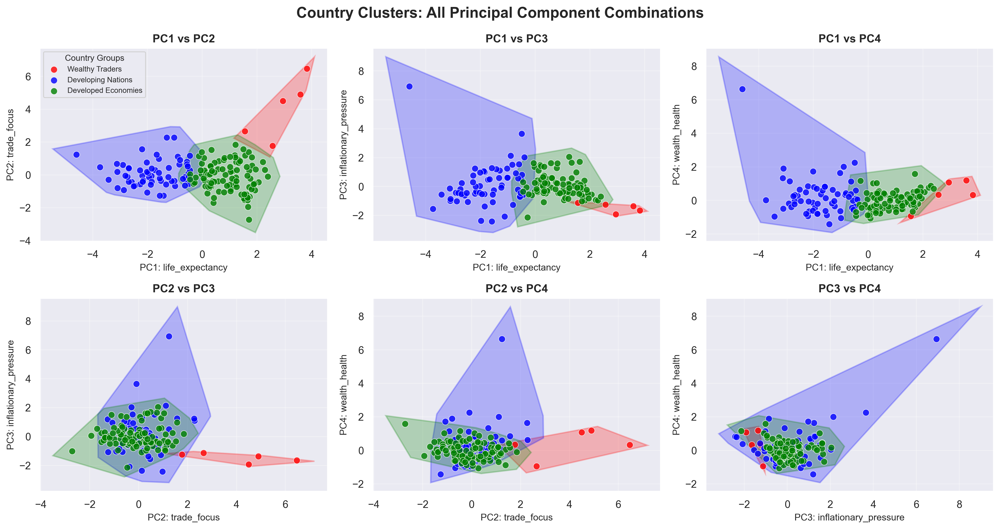

In [12]:
kMeans_3 = KMeans(n_clusters=3, random_state=SEED, n_init=10).fit(pca_data_B)
cluster_names_3 = {
    0: "Wealthy Traders",
    1: "Developing Nations",
    2: "Developed Economies",
}

pca_plot(kMeans = kMeans_3, pca_data = pca_data_B, cluster_names=cluster_names_3, pc1 = 0, pc2 = 1, filename='pca_plot_kMeans_3')
plot_all_pca_combinations_with_hulls(pca_data_B, labels = kMeans_3.labels_, cluster_names=cluster_names_3, n_components=4, expansion=0.3, filename='pca_combos_kMeans_3')

This three cluster model works for the data with outliers. However, it seems considerably less insightful than our initial version (with Winsorization). There is nothing that indicates that the initial model is misleading. Rather, it adds more differentiation and clarity to our cluster modelling.

## 5) Alternative Models
1) DBSCAN
2) Hierarchical Clustering

### DBSCAN
I was interested in seeing how DBSCAN performs because (a) I haven't used it before, (b) it supports non 'spherical' clusters, which might improve the possibility of clear clusters in this dataset.

Comparing  k-Means and DBSCAN clustering, key differences are:
1) ** Cluster Structure **: k-Means forces all points into clusters, while DBSCAN can identify outliers / noise points
2) ** Cluster Shape **: k-Means assumes spherical clusters, DBSCAN can find arbitrary shapes
3) ** Parameter Sensitivity **: k-Means requires specifying k, DBSCAN requires _eps_ and _min_samples_

**Note:** I use the AI assistant to generate the code for DBSCAN, because I did not want to spend time on it until I had a better idea whether it offered advantages.

#### DBSCAN - lessons learned (for this dataset)
- Both k-Means and DBSCAN predicted the optimal number of clusters as 2 based on the silhouette score.
- Comparing a k-Means solution for 5 clusters with a DBSCAN solution for 2 clusters didn't seem worthwhile. I already knew a 2-cluster solution was optimal but offered little insight. However, tuning eps and min_samples to generate 4 or 5 clusters from DBSCAN did not yield clusters that were as strongly separated as for the k-Means solution.
- The number of outliers not classified by DBSCAN grows quickly once moving from the 2-cluster optimal solution.

In summary, with simple tuning I could not get DBSCAN to perform as well as k-Means on this dataset. I've kept the AI generated code in the Appendix for reference.

### Hierarchical Clustering

The dendogram generated from pca_data again shows the strongest separation is for two clusters. All three methods reach the same conclusion, the development divide between wealthy countries with long life expectancies and poorer countries with health challenges is stronger than other features.

However, setting the number of clusters = 5 still shows that the k_Means solution offers the most clarity; evaluated intuitively based on inspecting cluster membership or using scoring such as Silhouette scores.

Figure saved: figs/5510_final_project/dendrogram_hierarchical.png


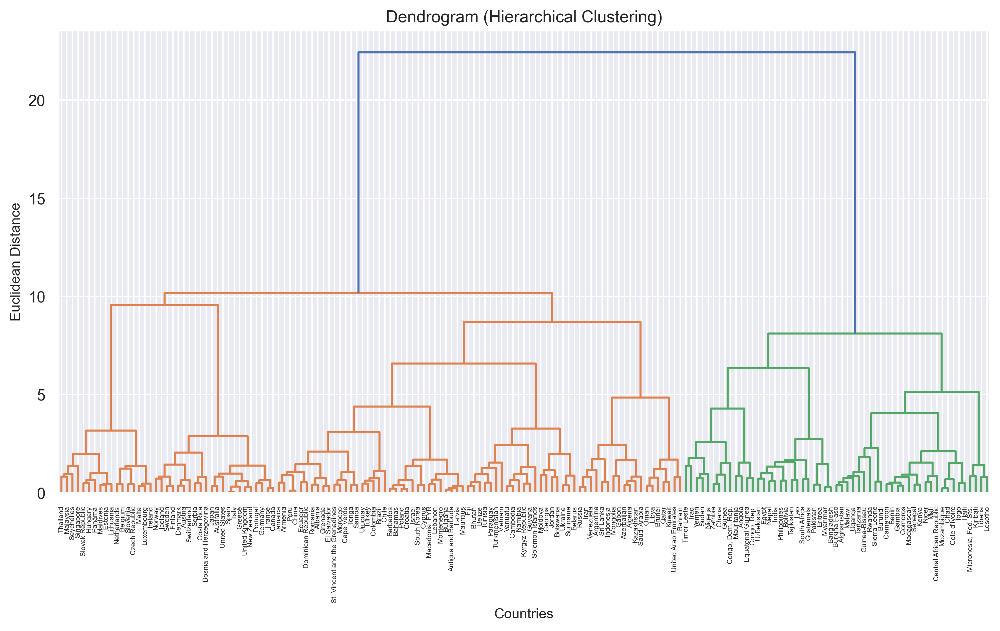

CLUSTERING COMPARISON: K-Means vs Hierarchical
                       country  kmeans_cluster  hierarchical_cluster  clusters_match
           Antigua and Barbuda               0                     1           False
                      Bulgaria               0                     1           False
                        Cyprus               0                     1           False
                        Latvia               0                     1           False
                     Mauritius               0                     1           False
                       Vietnam               0                     1           False
                       Belgium               0                     2           False
                Czech Republic               0                     2           False
                       Estonia               0                     2           False
                       Hungary               0                     2           False
                  

In [13]:
hc_data = pca_data

plt.figure(figsize=(12,6))
Z = sch.linkage(hc_data, method='ward')
dendrogram = sch.dendrogram(Z,
                            orientation='top',
                            labels=country_data['country'].values,
                            distance_sort='descending',
                            show_leaf_counts=True,
                            )
plt.title("Dendrogram (Hierarchical Clustering)")
plt.xlabel("Countries")
plt.ylabel("Euclidean Distance")
save_figure('dendrogram_hierarchical')
plt.show()

# Get both clustering results (k_Means and AgglomerativeClustering)
hc = AgglomerativeClustering(n_clusters=5, linkage='ward')
labels_hc = hc.fit_predict(hc_data)
labels_kmeans = kMeans_optimal.labels_

# Create comparison DataFrame
comparison_df = pd.DataFrame({
    'country': country_data['country'],
    'kmeans_cluster': labels_kmeans,
    'hierarchical_cluster': labels_hc
})

# Add a column showing if clusters match
comparison_df['clusters_match'] = comparison_df['kmeans_cluster'] == comparison_df['hierarchical_cluster']

print("CLUSTERING COMPARISON: K-Means vs Hierarchical")
print("=" * 65)
print(comparison_df.sort_values(['kmeans_cluster', 'hierarchical_cluster']).to_string(index=False))

# Summary statistics
total_countries = len(comparison_df)
matching_assignments = comparison_df['clusters_match'].sum()
agreement_percentage = (matching_assignments / total_countries) * 100

print(f"\nOverall Agreement: {matching_assignments}/{total_countries} countries ({agreement_percentage:.1f}%)")


In [14]:
def compare_clustering_quality(data, kmeans_labels, hc_labels):
    """Compare clustering quality metrics between two clustering solutions"""

    metrics_comparison = pd.DataFrame({
        'Metric': ['Silhouette Score', 'Calinski-Harabasz Index', 'Davies-Bouldin Index'],
        'K-Means': [
            silhouette_score(data, kmeans_labels),
            calinski_harabasz_score(data, kmeans_labels),
            davies_bouldin_score(data, kmeans_labels)
        ],
        'Hierarchical': [
            silhouette_score(data, hc_labels),
            calinski_harabasz_score(data, hc_labels),
            davies_bouldin_score(data, hc_labels)
        ]
    })

    # Add interpretation column
    metrics_comparison['Better Method'] = ['Higher is better', 'Higher is better', 'Lower is better']

    # Determine winner for each metric
    winners = []
    for i, row in metrics_comparison.iterrows():
        kmeans_val = row['K-Means']
        hc_val = row['Hierarchical']

        if row['Better Method'] == 'Higher is better':
            winner = 'K-Means' if kmeans_val > hc_val else 'Hierarchical'
        else:  # Lower is better
            winner = 'K-Means' if kmeans_val < hc_val else 'Hierarchical'
        winners.append(winner)

    metrics_comparison['Winner'] = winners

    print("CLUSTERING QUALITY COMPARISON")
    print("=" * 50)
    print(metrics_comparison.round(3).to_string(index=False))

    return metrics_comparison

# Compare using PCA data (same as used for K-means)
quality_comparison = compare_clustering_quality(pca_data, labels_kmeans, labels_hc)

CLUSTERING QUALITY COMPARISON
                 Metric  K-Means  Hierarchical    Better Method       Winner
       Silhouette Score    0.302         0.263 Higher is better      K-Means
Calinski-Harabasz Index   84.163        69.206 Higher is better      K-Means
   Davies-Bouldin Index    1.154         1.125  Lower is better Hierarchical


## 6) Conclusions and Lessons Learned

### Analysis and Thoughts

1) Whilst the optimal number of clusters is 2 according to the scoring (irrespective of which clustering methods are used), a k-Means cluster solution with 5 clusters is more informative and intuitively understandable.
2) Outlier treatment is critical, especially with k-Means clustering. The combination of log-scaling, winsorization and RobustScaler proved an effective way to deal with the outliers whilst retaining the essential characteristics of the data.
3) Spending time on understanding the principal components before clustering was highly worthwhile. (a) It helped data understanding, (b) without this exercise, I would not have spotted a critical error in my original pre-processing: namely, that the log transformations changed the column order, which made the resulting analysis incorrect.
4) Visualising the clusters using PCA bi-plots is a powerful way to understand the data. The two techniques employed (a) adding vectors representing the original features and (b) adding hulls to quickly visualise cluster separation with multiple principal component combinations were both effective tools that I willl reuse going forward.
5) Naming Clusters was hard. It required me to go beyond the visualizations and supplement this with a comprehensive detailed print out of the cluster information. The time spent was worthwhile, in terms of the understanding I gained. I'm still an amateur when it comes to naming, but this will improve with practice.
6) I would have needed to spend more time on the DBSCAN model and the Hierarchical Clustering model to understand their strengths and weaknesses. However, given the time constraints, this will have to be deferred to next steps.
7) I am not yet comfortable with the basic issue with unsupervised learning: there are not easily available checks (predict, RMSE scoring, statistical significance,...) to validate the results. I will need to spend more time on this.

### Conclusions

A combination of outlier handling, PCA transformation and k-Means clustering was able to identify five clusters in the data: separated by the features of interest, and intuitively understandable.

The cluster I named "Least Developed Countries" probably is a good target set for the CEO of HELP Organisation to focus aid investment (see Introduction). However, whilst the data and clustering captures socio-economic need, it does little to help understand how effectively the aid could be deployed or the likely impact of the investment. I would want to do further modelling of these aspects before making any firm recommendations.

As a learning exercise, this project was excellent. I feel I have substantially moved my understanding of unsupervised learning techniques forward. In particular, I would call out:
 - Handling outliers with differing scaling techniques and Winsorization.
  - PCA understanding and interpretation (with loading tables and charts to describe the principal components)
  - K-Means scoring to find optimal number of clusters using a basket of scoring metrics
 - Visualisation of clusters using PCA bi-plots (with feature vectors and hulls).
  - Time spent on understanding and interpretation should outweigh time spent on code generation.

## 7) Appendix

### DBSCAN CODE - AI Generated Code, where I ran out of time to make it my own and truly understand the process.

Figure saved: figs/5510_final_project/dbscan_k_distance_plot.png


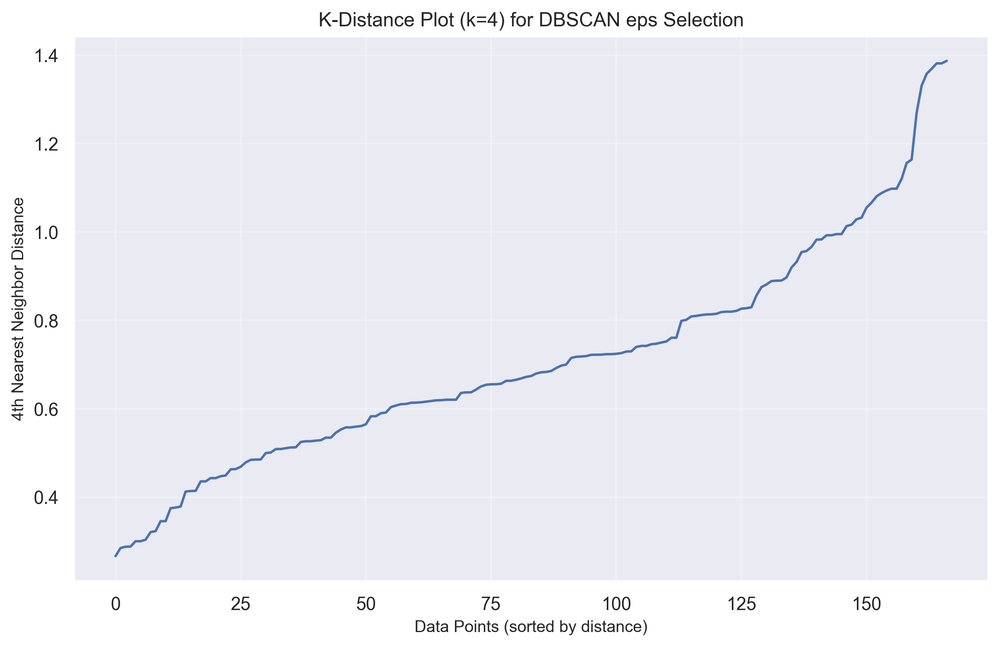

Suggested eps values based on k-distance plot: [0.72395959 0.81049665 0.89001582 0.98408487 1.04171834 1.14538804]

DBSCAN Parameter Evaluation:
       eps  min_samples  n_clusters  n_noise  silhouette_score  \
0   0.7240            3           4       38            0.1191   
1   0.8105            3           2       23            0.2588   
2   0.9841            3           2        2            0.1233   
3   0.7240            4           5       42           -0.0714   
4   0.8105            4           3       29            0.1785   
5   0.9841            4           2        7            0.1473   
6   0.7240            5           4       52            0.0876   
7   0.8105            5           3       32            0.1677   
8   0.8900            5           2       22            0.2767   
9   0.7240            6           2       68            0.1678   
10  0.8105            6           3       37            0.1429   
11  0.8900            6           2       26            0.2637 

In [15]:
# Use the same data as K-means (scaled_A)
data = scaled_A

def find_optimal_dbscan_params(data, k_range=range(3, 8), eps_range=None):
    """
    Find optimal DBSCAN parameters using k-distance plot and silhouette analysis
    """
    # First, apply PCA transformation (same as K-means)
    pca = PCA(n_components=0.9)
    pca_data = pca.fit_transform(data)

    # Create k-distance plot to help choose eps
    if eps_range is None:
        # Calculate k-nearest neighbors to determine eps range
        k = 4  # Common choice for eps estimation
        nbrs = NearestNeighbors(n_neighbors=k).fit(pca_data)
        distances, indices = nbrs.kneighbors(pca_data)
        distances = np.sort(distances[:, k - 1], axis=0)

        plt.figure(figsize=(10, 6))
        plt.plot(distances)
        plt.title('K-Distance Plot (k=4) for DBSCAN eps Selection')
        plt.xlabel('Data Points (sorted by distance)')
        plt.ylabel('4th Nearest Neighbor Distance')
        plt.grid(True, alpha=0.3)
        save_figure('dbscan_k_distance_plot')
        plt.show()

        # Suggest eps range based on the elbow in k-distance plot
        # Using percentiles of distances for systematic eps selection
        eps_range = np.percentile(distances, [60, 70, 80, 85, 90, 95])
        print(f"Suggested eps values based on k-distance plot: {eps_range}")

    # Evaluate different parameter combinations
    results = []

    for min_samples in k_range:
        for eps in eps_range:
            dbscan = DBSCAN(eps=eps, min_samples=min_samples)
            labels = dbscan.fit_predict(pca_data)

            # Skip if all points are noise or only one cluster
            n_clusters = len(set(labels)) - (1 if -1 in labels else 0)
            n_noise = list(labels).count(-1)

            if n_clusters > 1:  # Need at least 2 clusters for silhouette score
                silhouette = silhouette_score(pca_data, labels)
                calinski_harabasz = calinski_harabasz_score(pca_data, labels)
                davies_bouldin = davies_bouldin_score(pca_data, labels)

                results.append({
                    'eps': eps,
                    'min_samples': min_samples,
                    'n_clusters': n_clusters,
                    'n_noise': n_noise,
                    'silhouette_score': silhouette,
                    'calinski_harabasz': calinski_harabasz,
                    'davies_bouldin': davies_bouldin
                })

    # Convert to DataFrame for easier analysis
    results_df = pd.DataFrame(results)
    print("\nDBSCAN Parameter Evaluation:")
    print("=" * 60)
    print(results_df.round(4))

    return results_df, pca_data


# Find optimal parameters
dbscan_results, pca_data = find_optimal_dbscan_params(data)

# Select best parameters based on silhouette score
if not dbscan_results.empty:
    best_params = dbscan_results.loc[dbscan_results['silhouette_score'].idxmax()]
    print(f"\nBest DBSCAN parameters based on Silhouette Score:")
    print(f"eps: {best_params['eps']:.4f}")
    print(f"min_samples: {best_params['min_samples']}")
    print(f"Number of clusters: {best_params['n_clusters']}")
    print(f"Number of noise points: {best_params['n_noise']}")
    print(f"Silhouette Score: {best_params['silhouette_score']:.4f}")
else:
    # Fallback parameters if automatic selection fails
    best_params = {'eps': 0.5, 'min_samples': 5}
    print("Using fallback parameters: eps=0.5, min_samples=5")

# Create DBSCAN pipeline with optimal parameters
dbscan_pipeline = Pipeline([
    ('pca', PCA(n_components=0.9)),
    ('dbscan', DBSCAN(eps=best_params['eps'], min_samples=int(best_params['min_samples'])))
    # ('dbscan', DBSCAN(eps=0.724, min_samples=4)) - useed this line to vary the number of clusters produced by DBScan
])

# Fit DBSCAN
dbscan_results = dbscan_pipeline.fit(data)
dbscan_labels = dbscan_pipeline.named_steps['dbscan'].labels_
dbscan_pca_data = dbscan_pipeline.named_steps['pca'].transform(data)

# Get cluster statistics
n_clusters_dbscan = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
n_noise_dbscan = list(dbscan_labels).count(-1)

print(f"\nDBSCAN Results:")
print(f"Number of clusters: {n_clusters_dbscan}")
print(f"Number of noise points: {n_noise_dbscan}")
print(f"Number of points in clusters: {len(dbscan_labels) - n_noise_dbscan}")



Clustering Comparison:
              Metric  K-means   DBSCAN  Better
0   Silhouette Score   0.3017   0.3978  Higher
1  Calinski-Harabasz  84.1625  87.9229  Higher
2     Davies-Bouldin   1.1536   0.7763   Lower

Countries identified as noise/outliers by DBSCAN:
  - Angola
  - Argentina
  - Congo, Dem. Rep.
  - Congo, Rep.
  - Equatorial Guinea
  - Ghana
  - Iraq
  - Kiribati
  - Lesotho
  - Liberia
  - Mauritania
  - Micronesia, Fed. Sts.
  - Moldova
  - Mongolia
  - Nigeria
  - Rwanda
  - Sierra Leone
  - Singapore
  - Sudan
  - Timor-Leste
  - Vietnam
  - Yemen
Figure saved: figs/5510_final_project/kmeans_vs_dbscan_comparison.png


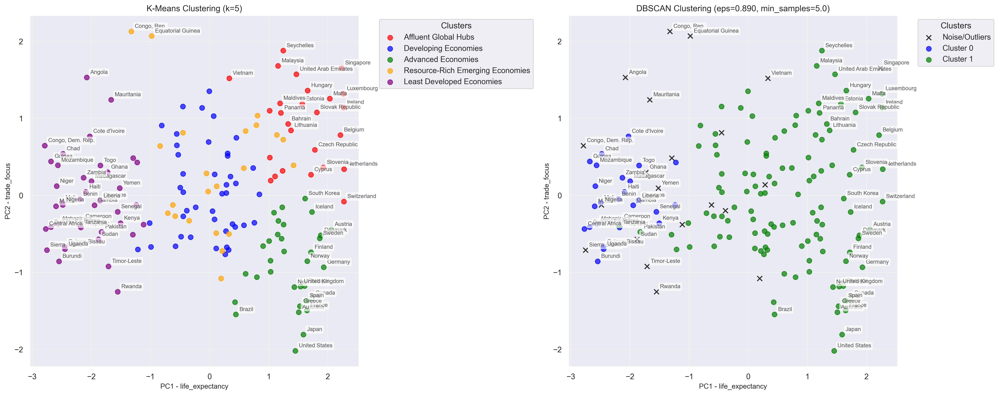

In [16]:
### Comparison: K-means vs DBSCAN

def compare_clustering_results(kmeans_labels, dbscan_labels, pca_data, country_names):
    """
    Compare K-means and DBSCAN clustering results
    """
    print("Clustering Comparison:")
    print("=" * 50)

    # Calculate metrics for both methods (exclude noise points for DBSCAN)
    # For fair comparison, only use non-noise points
    non_noise_mask = dbscan_labels != -1

    if np.sum(non_noise_mask) > 1:  # Ensure we have enough points for metrics
        dbscan_labels_clean = dbscan_labels[non_noise_mask]
        pca_data_clean = pca_data[non_noise_mask]
        kmeans_labels_clean = kmeans_labels[non_noise_mask]

        # DBSCAN metrics (excluding noise)
        if len(set(dbscan_labels_clean)) > 1:
            dbscan_silhouette = silhouette_score(pca_data_clean, dbscan_labels_clean)
            dbscan_calinski = calinski_harabasz_score(pca_data_clean, dbscan_labels_clean)
            dbscan_davies = davies_bouldin_score(pca_data_clean, dbscan_labels_clean)
        else:
            dbscan_silhouette = dbscan_calinski = dbscan_davies = np.nan

        # K-means metrics (all points)
        kmeans_silhouette = silhouette_score(pca_data, kmeans_labels)
        kmeans_calinski = calinski_harabasz_score(pca_data, kmeans_labels)
        kmeans_davies = davies_bouldin_score(pca_data, kmeans_labels)
    else:
        print("Not enough valid clusters for comparison")
        return

    # Create comparison table
    comparison_data = {
        'Metric': ['Silhouette Score', 'Calinski-Harabasz', 'Davies-Bouldin'],
        'K-means': [kmeans_silhouette, kmeans_calinski, kmeans_davies],
        'DBSCAN': [dbscan_silhouette, dbscan_calinski, dbscan_davies],
        'Better': ['Higher', 'Higher', 'Lower']
    }

    comparison_df = pd.DataFrame(comparison_data)
    print(comparison_df.round(4))

    # Identify noise countries
    noise_countries = country_names[dbscan_labels == -1]
    if len(noise_countries) > 0:
        print(f"\nCountries identified as noise/outliers by DBSCAN:")
        for country in noise_countries:
            print(f"  - {country}")

    return comparison_df


# Get K-means results for comparison
kmeans_labels = kMeans_optimal.labels_
kmeans_pca_data = pca_data

# Compare the results
comparison_results = compare_clustering_results(
    kmeans_labels, dbscan_labels, pca_data,
    country_data['country'].values
)


# Create side-by-side visualization
def plot_clustering_comparison(kmeans_labels, dbscan_labels, pca_data, country_names):
    """
    Create side-by-side plots comparing K-means and DBSCAN results
    """
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))

    # K-means plot
    unique_kmeans = np.unique(kmeans_labels)
    colors_kmeans = ['red', 'blue', 'green', 'orange', 'purple'][:len(unique_kmeans)]

    for i, label in enumerate(unique_kmeans):
        mask = kmeans_labels == label
        cluster_name = cluster_names.get(label, f'Cluster {label}')
        ax1.scatter(pca_data[mask, 0], pca_data[mask, 1],
                    c=[colors_kmeans[i]], label=cluster_name, alpha=0.7, s=50)

    ax1.set_xlabel(f'PC1 - {pca_names[0]}')
    ax1.set_ylabel(f'PC2 - {pca_names[1]}')
    ax1.set_title('K-Means Clustering (k=5)')
    ax1.legend(title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax1.grid(True, alpha=0.3)

    # DBSCAN plot
    unique_dbscan = np.unique(dbscan_labels)
    colors_dbscan = ['red', 'blue', 'green', 'orange', 'purple', 'brown', 'pink']

    for i, label in enumerate(unique_dbscan):
        mask = dbscan_labels == label
        if label == -1:
            # Noise points
            ax2.scatter(pca_data[mask, 0], pca_data[mask, 1],
                        c='black', label='Noise/Outliers', marker='x', s=50, alpha=0.8)
        else:
            ax2.scatter(pca_data[mask, 0], pca_data[mask, 1],
                        c=[colors_dbscan[i]], label=f'Cluster {label}', alpha=0.7, s=50)

    ax2.set_xlabel(f'PC1 - {pca_names[0]}')
    ax2.set_ylabel(f'PC2 - {pca_names[1]}')
    ax2.set_title(f'DBSCAN Clustering (eps={best_params["eps"]:.3f}, min_samples={best_params["min_samples"]})')
    ax2.legend(title='Clusters', bbox_to_anchor=(1.05, 1), loc='upper left')
    ax2.grid(True, alpha=0.3)

    # Label extreme points in both plots
    for i, country in enumerate(country_names):
        x, y = pca_data[i, 0], pca_data[i, 1]
        distance_from_origin = np.sqrt(x ** 2 + y ** 2)

        if (distance_from_origin > 1.5 or abs(x) > 1.5 or abs(y) > 1.5):
            # Label in both plots
            for ax in [ax1, ax2]:
                ax.annotate(country, (x, y),
                            xytext=(5, 5), textcoords='offset points',
                            fontsize=8, alpha=0.8,
                            bbox=dict(boxstyle='round,pad=0.2', facecolor='white', alpha=0.6))

    plt.tight_layout()
    save_figure('kmeans_vs_dbscan_comparison')
    plt.show()


# Create the comparison plot
plot_clustering_comparison(kmeans_labels, dbscan_labels, pca_data, country_data['country'].values)

